In [ ]:
import os
import pandas as pd
import numpy as np
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# PyTorch
import torch as T
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models
from torchvision import transforms

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define paths

zip_path = '/content/drive/MyDrive/dog-breed-identification.zip'
extract_path = '/content/dog_breed_dataset'

# Unzip the dataset
import zipfile
import os

if not os.path.exists(extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Dataset extracted successfully!")
else:
    print("Dataset already extracted!")

# Check dataset structure and load labels

labels_csv_path = os.path.join(extract_path, 'labels.csv')
train_image_path = os.path.join(extract_path, 'train')

if os.path.exists(labels_csv_path):
    labels_df = pd.read_csv(labels_csv_path)
    breeds = labels_df['breed'].unique().tolist()
    print("Total breeds found:", len(breeds))
    print("Example breed folders (from labels.csv):", breeds[:5])

    if os.path.exists(train_image_path):
        print(f"Number of training images found: {len(os.listdir(train_image_path))}")
    else:
        print(f"Training image directory not found at {train_image_path}")
else:
    print(f"labels.csv not found at {labels_csv_path}")
    breeds = []


Mounted at /content/drive
Dataset extracted successfully!
Total breeds found: 120
Example breed folders (from labels.csv): ['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever']
Number of training images found: 10222


In [ ]:
# Read csv file
train_data = pd.read_csv(labels_csv_path)
# Train data shape
print(f"Train dataset shape: {train_data.shape}")
# Sample of the train_data DataFrame
train_data.head()

Train dataset shape: (10222, 2)


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
from ydata_profiling import ProfileReport
import pandas as pd

profile = ProfileReport(df, progress_bar=False)
profile.to_notebook_iframe()


100%|██████████| 2/2 [00:00<00:00, 13.67it/s]


/tmp/ipython-input-1821080065.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=breed_classes, x='breed', y='count', palette="flare")


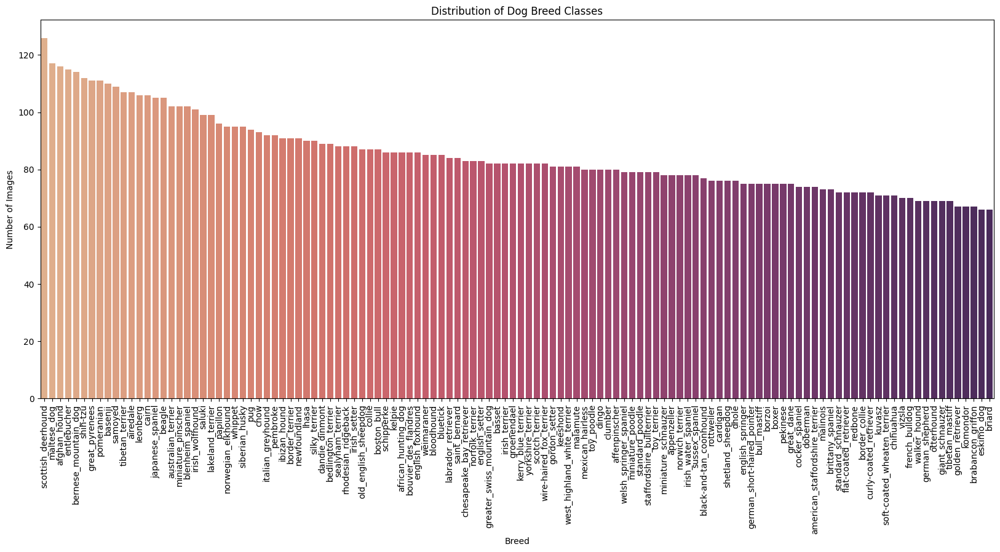

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count of images per breed
breed_classes = labels_df['breed'].value_counts().reset_index()
breed_classes.columns = ['breed', 'count']

plt.figure(figsize=(20,8))
sns.barplot(data=breed_classes, x='breed', y='count', palette="flare")
plt.xticks(rotation=90)
plt.title("Distribution of Dog Breed Classes")
plt.xlabel("Breed")
plt.ylabel("Number of Images")
plt.show()


In [ ]:
import cv2
import numpy as np
import os
import pandas as pd

# Path to your training images and labels CSV
TRAIN_IMAGES_DIR = "/content/dog_breed_dataset/train"
LABELS_CSV = "/content/dog_breed_dataset/labels.csv"

# Load labels CSV
labels_df = pd.read_csv(LABELS_CSV)

# Use labels_df as your df
df = labels_df.copy()
image_dir = TRAIN_IMAGES_DIR

# Function to read and resize an image
def read_and_resize_image_rgb(file_path):
    img = cv2.imread(file_path)
    if img is None:
        print(f"Warning: Could not read image: {file_path}")
        return None
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb_resized = cv2.resize(img_rgb, (224, 224))
    return img_rgb_resized

# Resize all images
resized_images = []
for idx, filename in enumerate(df['id']):
    img_path = os.path.join(image_dir, filename + '.jpg')
    resized_img = read_and_resize_image_rgb(img_path)
    if resized_img is not None:
        resized_images.append(resized_img)

resized_images_array = np.array(resized_images)
print("Resized images shape:", resized_images_array.shape)



Resized images shape: (10222, 224, 224, 3)


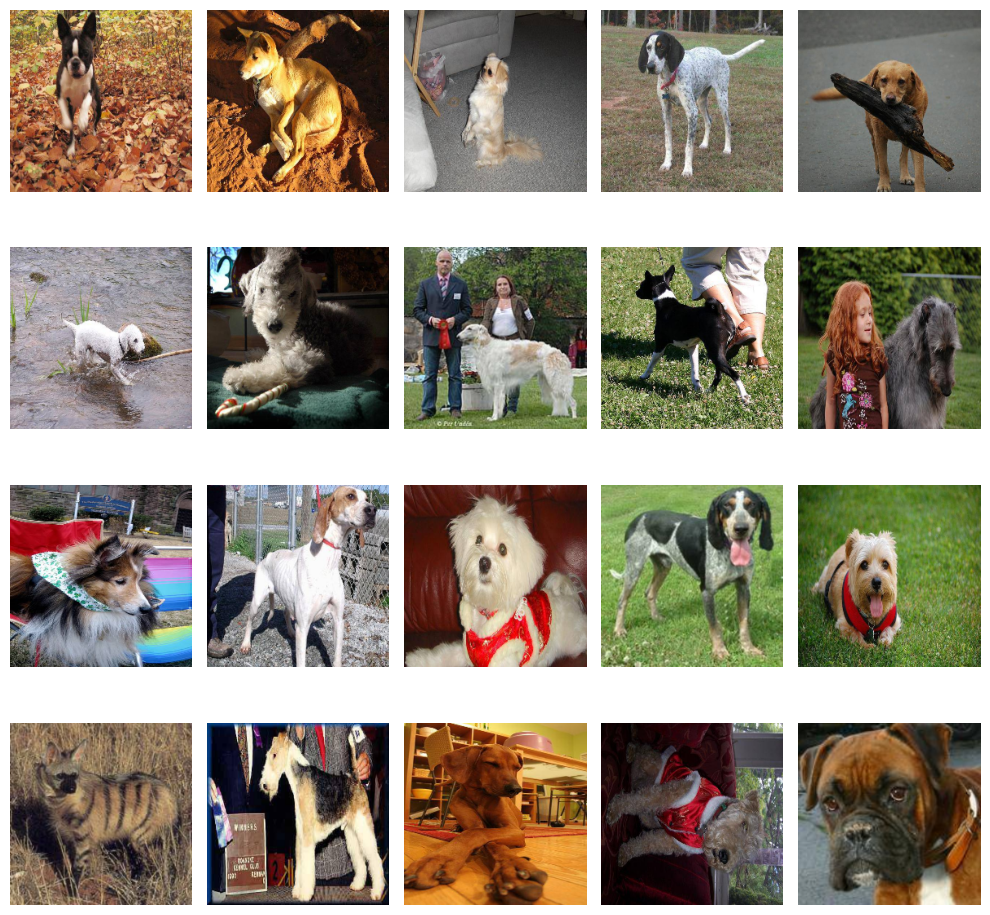

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(20):
    plt.subplot(4, 5, i + 1)
    plt.imshow(resized_images_array[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

# Hybrid ResNet Classifier(ResNet50 + ResNeXt101)

In [ ]:
import os
import random
import shutil
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torchvision.models import ResNet50_Weights, ResNeXt101_32X8D_Weights
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import matplotlib.pyplot as plt

# Configuration
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

SAVE_PATH = "best_dog_model.pth"
PLOT_PATH = "training_history.png"
DRIVE_DEST = "MyDrive/dog_breed_models"

DATA_DIR = "/content/dog_breed_dataset"
TRAIN_IMAGES_DIR = os.path.join(DATA_DIR, "train")
LABELS_CSV = os.path.join(DATA_DIR, "labels.csv")

BATCH_SIZE = 32
NUM_WORKERS = 2
EPOCHS = 20
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)

# make cuDNN deterministic for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Load labels
labels_df = pd.read_csv(LABELS_CSV)
NUM_CLASSES = labels_df['breed'].nunique()
print("Classes:", NUM_CLASSES)

train_df, val_df = train_test_split(
    labels_df, test_size=0.20, stratify=labels_df['breed'], random_state=SEED
)
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

# Transforms
train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.7,1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(0.2,0.2,0.15),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225]),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225]),
])

# Dataset with fixed mapping
unique_breeds = sorted(train_df['breed'].unique())
class_to_idx = {b:i for i,b in enumerate(unique_breeds)}
idx_to_class = {v:k for k,v in class_to_idx.items()}

class DogDataset(Dataset)
    def __init__(self, df, img_dir, tfms, class_to_idx):
        self.df = df
        self.img_dir = img_dir
        self.tfms = tfms
        self.class_to_idx = class_to_idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.loc[idx]
        path = os.path.join(self.img_dir, row['id'] + ".jpg")
        img = Image.open(path).convert("RGB")
        img = self.tfms(img)
        label = self.class_to_idx[row['breed']]
        return img, label

train_ds = DogDataset(train_df, TRAIN_IMAGES_DIR, train_tfms, class_to_idx)
val_ds   = DogDataset(val_df, TRAIN_IMAGES_DIR, val_tfms, class_to_idx)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_dl   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

# Load pretrained backbones
resnet50 = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
resnext101 = models.resnext101_32x8d(weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V2)

resnet_feat = nn.Sequential(*list(resnet50.children())[:-1])
resnext_feat = nn.Sequential(*list(resnext101.children())[:-1])

# Freeze everything initially
for p in resnet_feat.parameters(): p.requires_grad = False
for p in resnext_feat.parameters(): p.requires_grad = False

resnet_feat.to(DEVICE)
resnext_feat.to(DEVICE)

#  Model
class HybridDogModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.r1 = resnet_feat
        self.r2 = resnext_feat

        # 2048 + 2048 = 4096 input dim
        self.classifier = nn.Sequential(
            nn.Linear(4096, 1024),
            nn.ReLU(True),
            nn.BatchNorm1d(1024),
            nn.Dropout(0.5),
            nn.Linear(1024, NUM_CLASSES)
        )

    def forward(self, x):
        x1 = self.r1(x).view(x.size(0), -1)
        x2 = self.r2(x).view(x.size(0), -1)
        x = torch.cat([x1, x2], dim=1)
        return self.classifier(x)

model = HybridDogModel().to(DEVICE)

# Unfreeze last residual block (not avgpool)
# Because resnet_feat = list(children())[:-1], the last meaningful block is at index -2
# (avgpool is at -1 which we removed; here -2 corresponds to layer4 usually).
for p in model.r1[-2].parameters():
    p.requires_grad = True
for p in model.r2[-2].parameters():
    p.requires_grad = True

# Optimiser, Loss, Scheduler
optimizer = optim.AdamW([
    {"params": model.classifier.parameters(), "lr": 3e-4},
    {"params": model.r1[-2].parameters(), "lr": 1e-5},
    {"params": model.r2[-2].parameters(), "lr": 1e-5},
], weight_decay=1e-4)

criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# Mixed precision: GradScaler
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))

# Training loop with history logging
best_acc = 0.0
history = {"train_acc": [], "val_acc": [], "train_loss": [], "val_loss": []}

for epoch in range(1, EPOCHS+1):
    print(f"\nEpoch {epoch}/{EPOCHS}")
    model.train()
    correct = total = 0
    run_loss = 0.0

    loop = tqdm(train_dl, desc="Train", leave=False)
    for imgs, labels in loop:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()

        # Mixed precision autocast
        with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
            outputs = model(imgs)
            loss = criterion(outputs, labels)

        # scaler handles backward & step
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        run_loss += loss.item() * labels.size(0)
        preds = outputs.argmax(1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = run_loss / total

    # Validation
    model.eval()
    correct = total = 0
    val_loss = 0.0

    with torch.no_grad():
        for imgs, labels in tqdm(val_dl, desc="Val", leave=False):
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
                outputs = model(imgs)
                loss = criterion(outputs, labels)

            val_loss += loss.item() * labels.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_acc = correct / total
    val_loss = val_loss / total

    scheduler.step()

    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save({"model": model.state_dict(), "class_to_idx": class_to_idx}, SAVE_PATH)
        print("✔ Best model saved locally as", SAVE_PATH)

print("Training completed. Best Val Acc =", best_acc)

# Plot and save training graphs
plt.figure(figsize=(8,5))
plt.plot(history["train_acc"], label="train_acc")
plt.plot(history["val_acc"], label="val_acc")
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("accuracy_"+PLOT_PATH)
plt.close()

plt.figure(figsize=(8,5))
plt.plot(history["train_loss"], label="train_loss")
plt.plot(history["val_loss"], label="val_loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_"+PLOT_PATH)
plt.close()

print("Training graphs saved:", "accuracy_"+PLOT_PATH, "loss_"+PLOT_PATH)


try:
    # mount drive only if google.colab is available
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
    drive_out_dir = os.path.join("/content/drive", DRIVE_DEST)
    os.makedirs(drive_out_dir, exist_ok=True)

    # copy model
    shutil.copy(SAVE_PATH, os.path.join(drive_out_dir, SAVE_PATH))
    shutil.copy("accuracy_"+PLOT_PATH, os.path.join(drive_out_dir, "accuracy_"+PLOT_PATH))
    shutil.copy("loss_"+PLOT_PATH, os.path.join(drive_out_dir, "loss_"+PLOT_PATH))
    print(f"Saved model and plots to Drive at: /content/drive/{DRIVE_DEST}")

except Exception as e:
    print("Google Drive copy skipped (not running in Colab or mount failed).")
    print("Exception:", e)
    print("Model and plots remain in the current working directory.")



Device: cuda
Classes: 120
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 212MB/s]


Downloading: "https://download.pytorch.org/models/resnext101_32x8d-110c445d.pth" to /root/.cache/torch/hub/checkpoints/resnext101_32x8d-110c445d.pth


100%|██████████| 340M/340M [00:02<00:00, 169MB/s]
/tmp/ipython-input-3175464189.py:157: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))



Epoch 1/20


Train:   0%|          | 0/256 [00:00<?, ?it/s]/tmp/ipython-input-3175464189.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
Val:   0%|          | 0/64 [00:00<?, ?it/s]/tmp/ipython-input-3175464189.py:200: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):


Train Acc: 0.7281 | Val Acc: 0.8919 | Train Loss: 1.5708 | Val Loss: 0.8063
✔ Best model saved locally as best_dog_model.pth

Epoch 2/20


Train Acc: 0.9153 | Val Acc: 0.9095 | Train Loss: 0.7591 | Val Loss: 0.7604
✔ Best model saved locally as best_dog_model.pth

Epoch 3/20


Train Acc: 0.9501 | Val Acc: 0.9071 | Train Loss: 0.6628 | Val Loss: 0.7591

Epoch 4/20


Train Acc: 0.9623 | Val Acc: 0.9144 | Train Loss: 0.6162 | Val Loss: 0.7433
✔ Best model saved locally as best_dog_model.pth

Epoch 5/20


Train Acc: 0.9769 | Val Acc: 0.9115 | Train Loss: 0.5806 | Val Loss: 0.7403

Epoch 6/20


Train Acc: 0.9814 | Val Acc: 0.9144 | Train Loss: 0.5649 | Val Loss: 0.7459

Epoch 7/20


Train Acc: 0.9886 | Val Acc: 0.9208 | Train Loss: 0.5489 | Val Loss: 0.7307
✔ Best model saved locally as best_dog_model.pth

Epoch 8/20


Train Acc: 0.9907 | Val Acc: 0.9208 | Train Loss: 0.5378 | Val Loss: 0.7354

Epoch 9/20


Train Acc: 0.9908 | Val Acc: 0.9159 | Train Loss: 0.5354 | Val Loss: 0.7415

Epoch 10/20


Train Acc: 0.9938 | Val Acc: 0.9188 | Train Loss: 0.5228 | Val Loss: 0.7350

Epoch 11/20


Train Acc: 0.9958 | Val Acc: 0.9213 | Train Loss: 0.5179 | Val Loss: 0.7290
✔ Best model saved locally as best_dog_model.pth

Epoch 12/20


Train Acc: 0.9965 | Val Acc: 0.9232 | Train Loss: 0.5130 | Val Loss: 0.7234
✔ Best model saved locally as best_dog_model.pth

Epoch 13/20


Train Acc: 0.9969 | Val Acc: 0.9232 | Train Loss: 0.5095 | Val Loss: 0.7201

Epoch 14/20


Train Acc: 0.9980 | Val Acc: 0.9257 | Train Loss: 0.5053 | Val Loss: 0.7166
✔ Best model saved locally as best_dog_model.pth

Epoch 15/20


Train Acc: 0.9983 | Val Acc: 0.9198 | Train Loss: 0.5009 | Val Loss: 0.7254

Epoch 16/20


Train Acc: 0.9984 | Val Acc: 0.9213 | Train Loss: 0.4992 | Val Loss: 0.7161

Epoch 17/20


Train Acc: 0.9982 | Val Acc: 0.9222 | Train Loss: 0.4964 | Val Loss: 0.7223

Epoch 18/20


Train Acc: 0.9977 | Val Acc: 0.9208 | Train Loss: 0.4970 | Val Loss: 0.7195

Epoch 19/20


Train Acc: 0.9991 | Val Acc: 0.9242 | Train Loss: 0.4945 | Val Loss: 0.7124

Epoch 20/20


Train Acc: 0.9990 | Val Acc: 0.9198 | Train Loss: 0.4940 | Val Loss: 0.7231
Training completed. Best Val Acc = 0.9256723716381418
Training graphs saved: accuracy_training_history.png loss_training_history.png
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Saved model and plots to Drive at: /content/drive/MyDrive/dog_breed_models


Accuracy Curve:


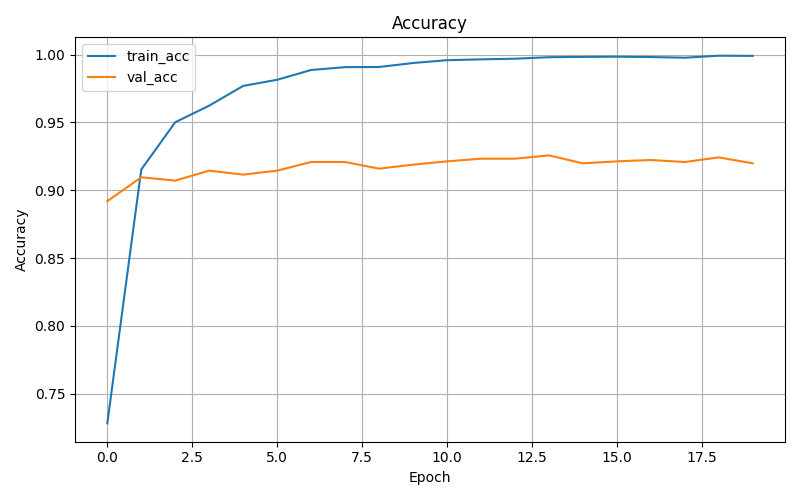

Loss Curve:


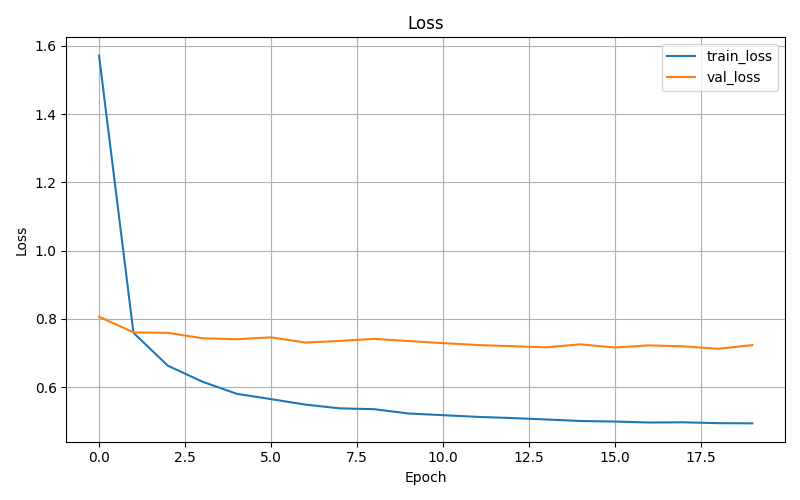

In [ ]:
# Display plots inside the notebook
from IPython.display import Image, display

print("Accuracy Curve:")
display(Image(filename="accuracy_training_history.png"))

print("Loss Curve:")
display(Image(filename="loss_training_history.png"))


In [ ]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt



Validation Accuracy: 92.62%

Classification Report:

                                precision    recall  f1-score   support

                 affenpinscher       1.00      0.94      0.97        16
                  afghan_hound       1.00      1.00      1.00        23
           african_hunting_dog       1.00      1.00      1.00        17
                      airedale       1.00      1.00      1.00        22
american_staffordshire_terrier       0.76      0.87      0.81        15
                   appenzeller       0.81      0.81      0.81        16
            australian_terrier       0.89      0.76      0.82        21
                       basenji       1.00      0.95      0.98        22
                        basset       0.89      1.00      0.94        16
                        beagle       1.00      0.95      0.98        21
            bedlington_terrier       1.00      1.00      1.00        18
          bernese_mountain_dog       0.96      0.96      0.96        23
       bl

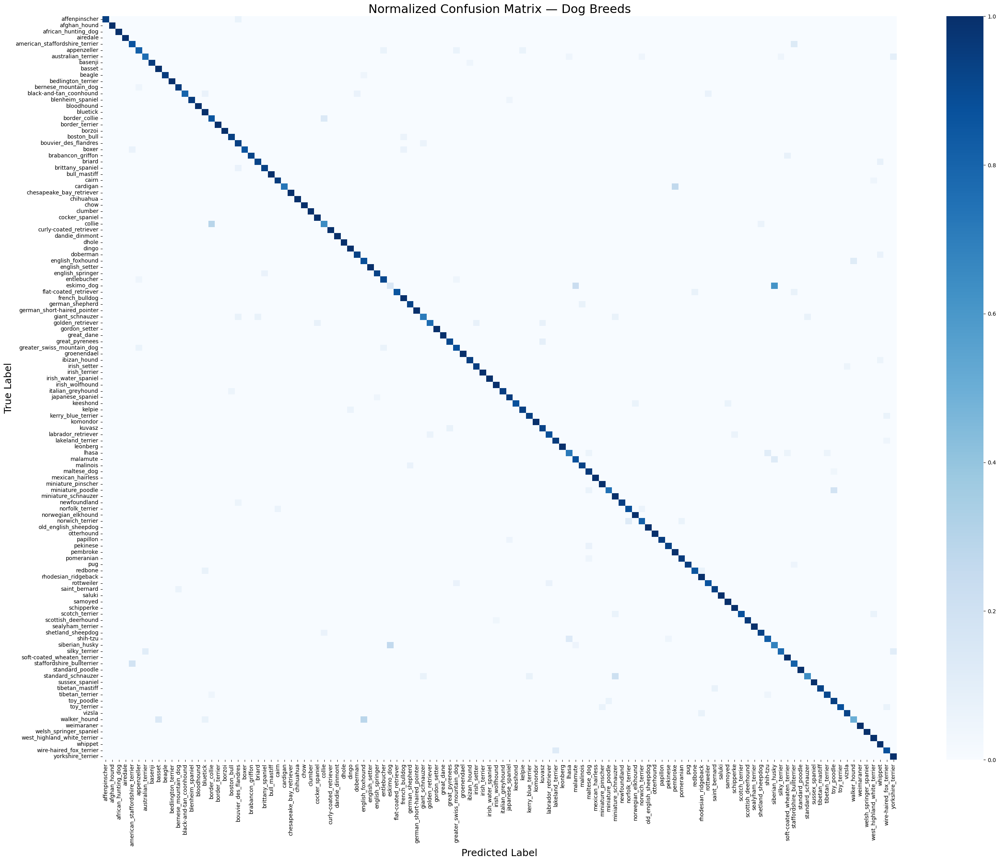

In [ ]:
import torch
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


#  Load the saved model

checkpoint = torch.load("/content/drive/MyDrive/dog_breed_models/best_dog_model.pth", map_location=DEVICE)

# Recreate your model structure
model = HybridDogModel().to(DEVICE)
model.load_state_dict(checkpoint['model'])
model.eval()


#  Make predictions on the validation set

true_labels = []
pred_labels = []

with torch.no_grad():
    for imgs, labels in val_dl:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)

        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(preds.cpu().numpy())


# Accuracy

acc = accuracy_score(true_labels, pred_labels)
print(f"\nValidation Accuracy: {acc*100:.2f}%")

# Classification Report

target_names = [idx_to_class[i] for i in range(len(idx_to_class))]

report = classification_report(true_labels, pred_labels, target_names=target_names)
print("\nClassification Report:\n")
print(report)


# Confusion Matrix (Normalised)

cm = confusion_matrix(true_labels, pred_labels)
cm_norm = cm / np.sum(cm, axis=1, keepdims=True)

plt.figure(figsize=(28, 22))
sns.heatmap(
    cm_norm,
    annot=False,
    fmt=".2f",
    cmap="Blues",
    xticklabels=target_names,
    yticklabels=target_names
)
plt.title("Normalized Confusion Matrix — Dog Breeds", fontsize=22)
plt.xlabel("Predicted Label", fontsize=18)
plt.ylabel("True Label", fontsize=18)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


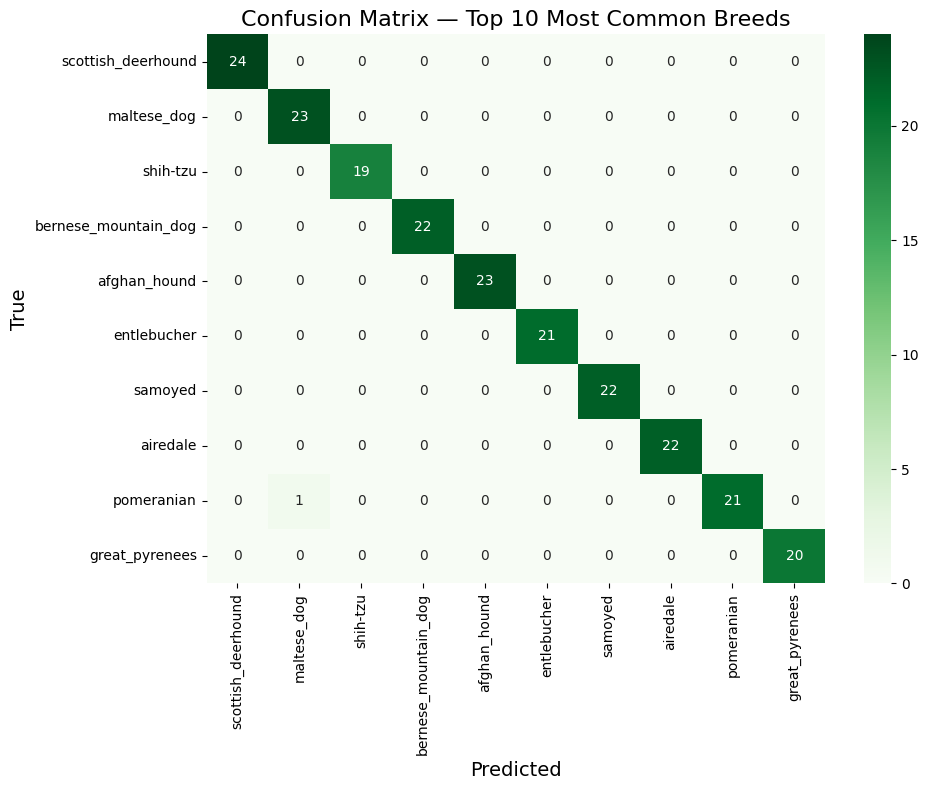

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert integer labels -> breed names
true_breeds = [idx_to_class[i] for i in true_labels]
pred_breeds = [idx_to_class[i] for i in pred_labels]

# Build DataFrame of predictions
results_df = pd.DataFrame({
    'True': true_breeds,
    'Pred': pred_breeds
})

# Find top 10 most common breeds in the validation set
top10 = results_df['True'].value_counts().index[:10]

# Filter predictions only for these breeds
subset_df = results_df[
    results_df['True'].isin(top10) & results_df['Pred'].isin(top10)
]

# Compute confusion matrix for top 10 breeds
cm_top10 = confusion_matrix(subset_df['True'], subset_df['Pred'], labels=top10)

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm_top10,
    annot=True,
    fmt='d',
    cmap='Greens',
    xticklabels=top10,
    yticklabels=top10
)
plt.title("Confusion Matrix — Top 10 Most Common Breeds", fontsize=16)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("True", fontsize=14)
plt.tight_layout()
plt.show()


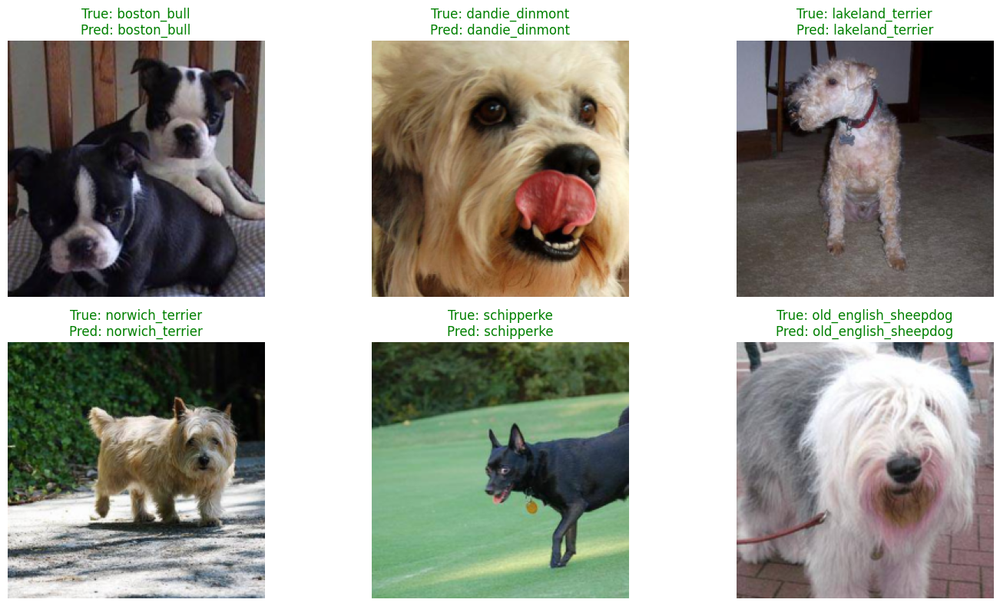

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np
from PIL import Image
import torch

# Set random seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Pick 6 random samples from validation dataset
sample_indices = random.sample(range(len(val_ds)), 6)

plt.figure(figsize=(15, 8))

for i, idx in enumerate(sample_indices):
    # Load image and true label
    img, true_label_idx = val_ds[idx]
    true_label = idx_to_class[true_label_idx]

    # Add batch dimension and send to device
    img_batch = img.unsqueeze(0).to(DEVICE)

    # Predict
    with torch.no_grad():
        outputs = model(img_batch)
        pred_idx = torch.argmax(outputs, dim=1).item()
        pred_label = idx_to_class[pred_idx]

    # Convert tensor to image for plotting
    img_np = img.permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]), 0, 1)

    # Plot
    plt.subplot(2, 3, i + 1)
    plt.imshow(img_np)
    plt.axis('off')
    color = 'green' if pred_label == true_label else 'red'
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)

plt.tight_layout()
plt.show()



Upload an image to test (or click cancel to stop):


Saving 0a0b97441050bba8e733506de4655ea1.jpg to 0a0b97441050bba8e733506de4655ea1.jpg


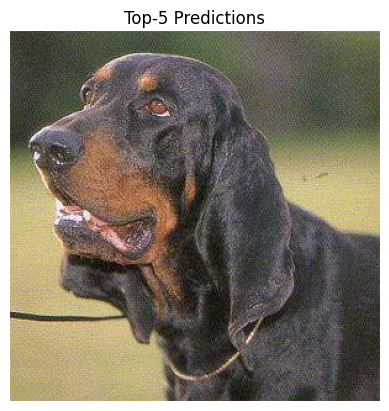

Prediction Results:
black-and-tan_coonhound   — 0.9098
gordon_setter             — 0.0280
basset                    — 0.0084
bloodhound                — 0.0049
walker_hound              — 0.0018

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a2a4ced84f11101720e47f4846945c6.jpg to 0a2a4ced84f11101720e47f4846945c6.jpg


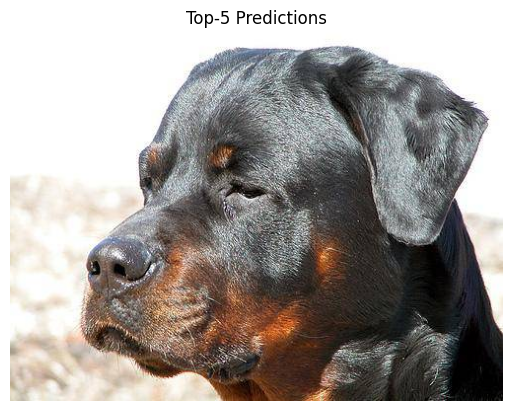

Prediction Results:
rottweiler                — 0.7902
gordon_setter             — 0.0625
weimaraner                — 0.0051
black-and-tan_coonhound   — 0.0049
doberman                  — 0.0038

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a1be1191b5c9d91392bb1e373600259.jpg to 0a1be1191b5c9d91392bb1e373600259.jpg


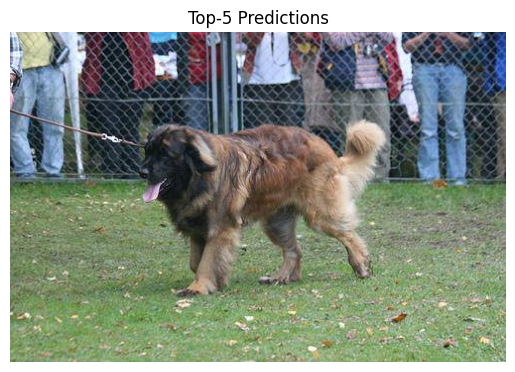

Prediction Results:
leonberg                  — 0.9407
siberian_husky            — 0.0021
shetland_sheepdog         — 0.0017
gordon_setter             — 0.0016
sealyham_terrier          — 0.0013

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 00a3edd22dc7859c487a64777fc8d093.jpg to 00a3edd22dc7859c487a64777fc8d093.jpg


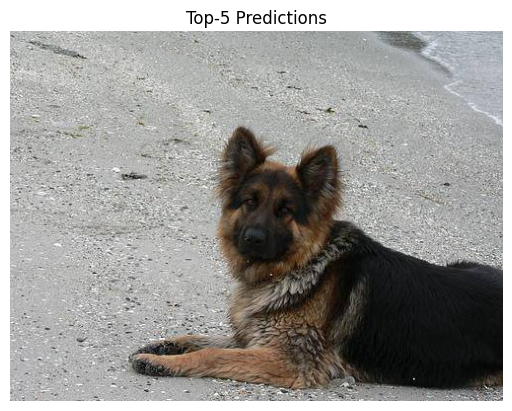

Prediction Results:
german_shepherd           — 0.9786
papillon                  — 0.0013
tibetan_mastiff           — 0.0005
clumber                   — 0.0004
walker_hound              — 0.0004

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a4ef19459cd2100977b052de5f46231.jpg to 0a4ef19459cd2100977b052de5f46231.jpg


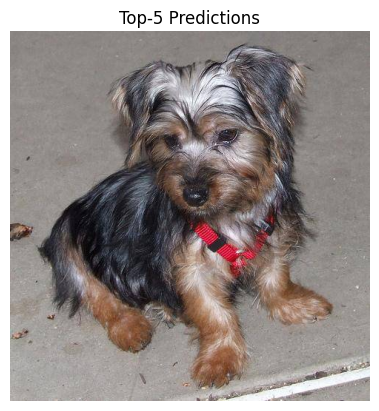

Prediction Results:
silky_terrier             — 0.9037
australian_terrier        — 0.0124
yorkshire_terrier         — 0.0085
wire-haired_fox_terrier   — 0.0044
doberman                  — 0.0017

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a7c46f223c4a4b7e7a2f25e8e023d73.jpg to 0a7c46f223c4a4b7e7a2f25e8e023d73.jpg


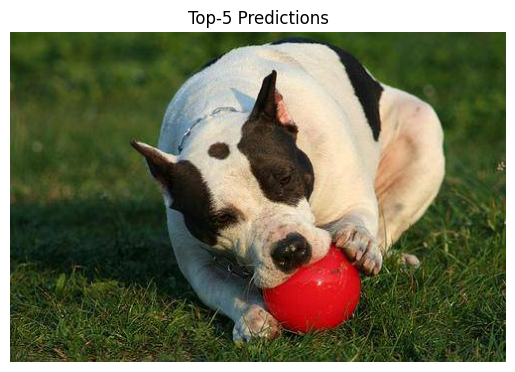

Prediction Results:
american_staffordshire_terrier — 0.5157
staffordshire_bullterrier — 0.0702
great_dane                — 0.0569
toy_terrier               — 0.0309
boston_bull               — 0.0131

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a50874d29b277cc889c0aa1cc8cd03c.jpg to 0a50874d29b277cc889c0aa1cc8cd03c.jpg


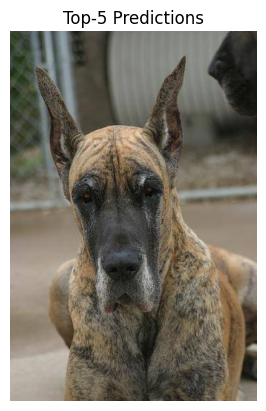

Prediction Results:
great_dane                — 0.9445
malinois                  — 0.0026
american_staffordshire_terrier — 0.0025
bull_mastiff              — 0.0016
dhole                     — 0.0012

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0a859b76a52d4fac456653a1d45ddf3d.jpg to 0a859b76a52d4fac456653a1d45ddf3d.jpg


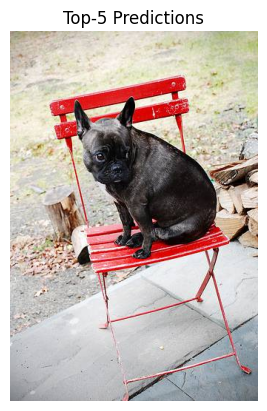

Prediction Results:
french_bulldog            — 0.8654
pug                       — 0.0351
affenpinscher             — 0.0101
brabancon_griffon         — 0.0071
staffordshire_bullterrier — 0.0036

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0ae4367c7f7149a43b0e5b1c07ce7ed9.jpg to 0ae4367c7f7149a43b0e5b1c07ce7ed9.jpg


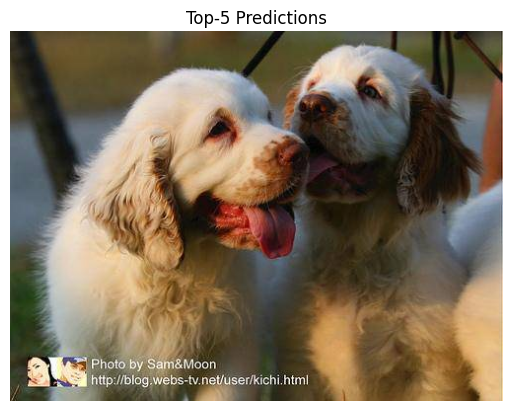

Prediction Results:
clumber                   — 0.9488
sussex_spaniel            — 0.0031
vizsla                    — 0.0021
lhasa                     — 0.0018
tibetan_mastiff           — 0.0013

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0cd0200ed88e2deae77d9407a4975f3f.jpg to 0cd0200ed88e2deae77d9407a4975f3f.jpg


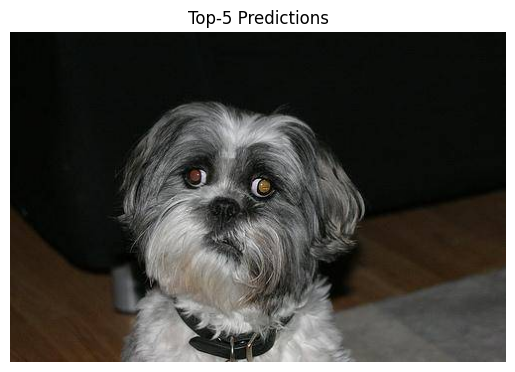

Prediction Results:
lhasa                     — 0.9619
affenpinscher             — 0.0026
yorkshire_terrier         — 0.0012
beagle                    — 0.0009
kelpie                    — 0.0007

Would you like to test another image? (y/n): y

Upload an image to test (or click cancel to stop):


Saving 0efe03910c7c5f576cf52c9e7c28beaa.jpg to 0efe03910c7c5f576cf52c9e7c28beaa.jpg


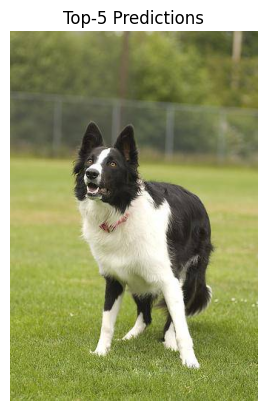

Prediction Results:
border_collie             — 0.8114
collie                    — 0.0582
appenzeller               — 0.0085
boston_bull               — 0.0063
german_shepherd           — 0.0058

Would you like to test another image? (y/n): n
Exiting image testing loop.


In [ ]:
from google.colab import files
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
from torchvision import transforms

# Test image transforms (same as val)
test_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225]),
])

while True:
    print("\nUpload an image to test (or click cancel to stop):")
    uploaded = files.upload()

    if not uploaded:
        print("No file uploaded. Stopping loop.")
        break

    for filename in uploaded.keys():
        img_path = filename
        # Load and preprocess image
        img = Image.open(img_path).convert("RGB")
        img_tensor = test_tfms(img).unsqueeze(0).to(DEVICE)

        # Predict
        model.eval()
        with torch.no_grad():
            outputs = model(img_tensor)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()[0]

        # Get top 5 predictions
        top5_idx = probs.argsort()[-5:][::-1]
        top5_labels = [(idx_to_class[i], probs[i]) for i in top5_idx]

        # Show image
        plt.imshow(np.array(img))
        plt.axis('off')
        plt.title("Top-5 Predictions")
        plt.show()

        # Print top 5
        print("Prediction Results:")
        for label, prob in top5_labels:
            print(f"{label:<25} — {prob:.4f}")

    # Ask  to continue
    cont = input("\nWould you like to test another image? (y/n): ").strip().lower()
    if cont not in ["y", "yes"]:
        print("Exiting image testing loop.")
        break


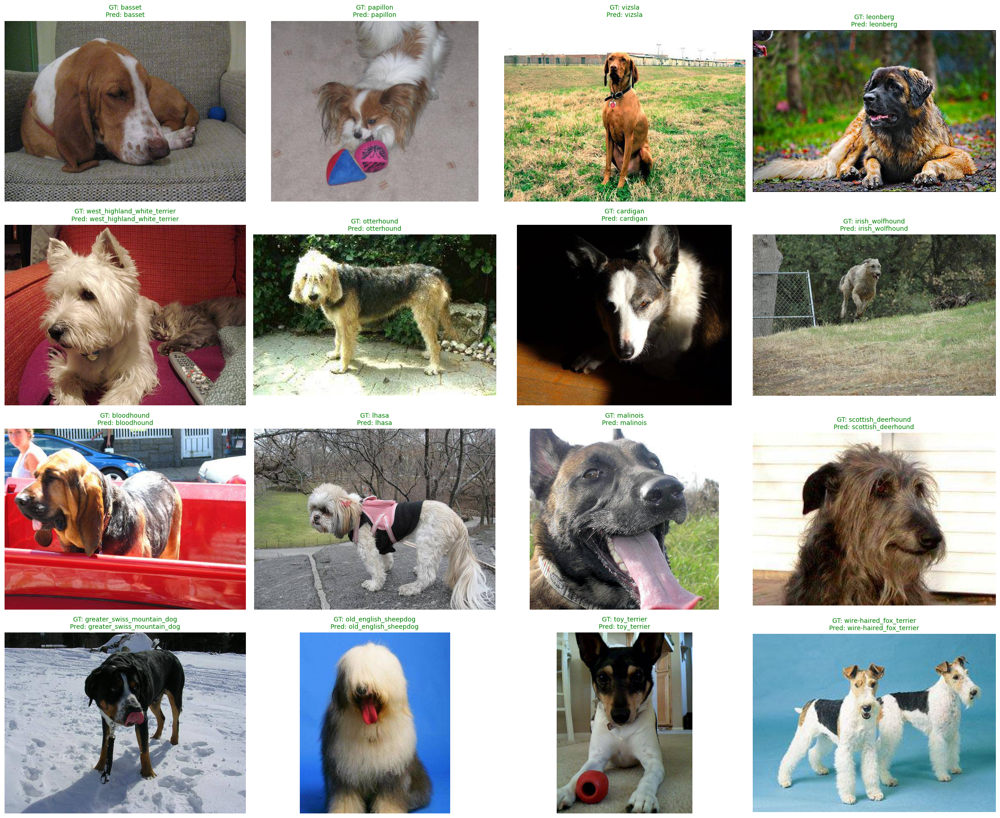

In [ ]:
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image
import torch

def predict_top1(img_path, model, tfms=val_tfms):
    """
    Returns the image and top-1 predicted label.
    """
    img = Image.open(img_path).convert("RGB")
    img_tensor = tfms(img).unsqueeze(0).to(DEVICE)

    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)
        pred_idx = torch.argmax(outputs, dim=1).item()
        pred_label = idx_to_class[pred_idx]

    return img, pred_label

def prediction_dashboard(df, img_dir, model, n=16, cols=4):
    sample = df.sample(n).reset_index(drop=True)
    rows = n // cols
    plt.figure(figsize=(22, 18))

    for i, row in sample.iterrows():
        img_path = os.path.join(img_dir, row['id'] + ".jpg")
        img, pred_label = predict_top1(img_path, model)

        true_label = row['breed']
        color = "green" if pred_label == true_label else "red"

        plt.subplot(rows, cols, i + 1)
        plt.imshow(np.array(img))
        plt.axis("off")
        plt.title(f"GT: {true_label}\nPred: {pred_label}", color=color, fontsize=10)

    plt.tight_layout()
    plt.show()




prediction_dashboard(val_df, TRAIN_IMAGES_DIR, model, n=16)
